In [1]:
import numpy as np
import jax.numpy as jnp
import jax


from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import nmu
from circuitmap import NeuralDemixer

import sys
sys.path.append('../')
import grid_utils as util
import subtract_utils as subtract_utils
%reload_ext subtract_utils

plt.rcParams['figure.dpi'] = 300

/Users/Bantin/anaconda3/envs/circuitmap/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Fig 1

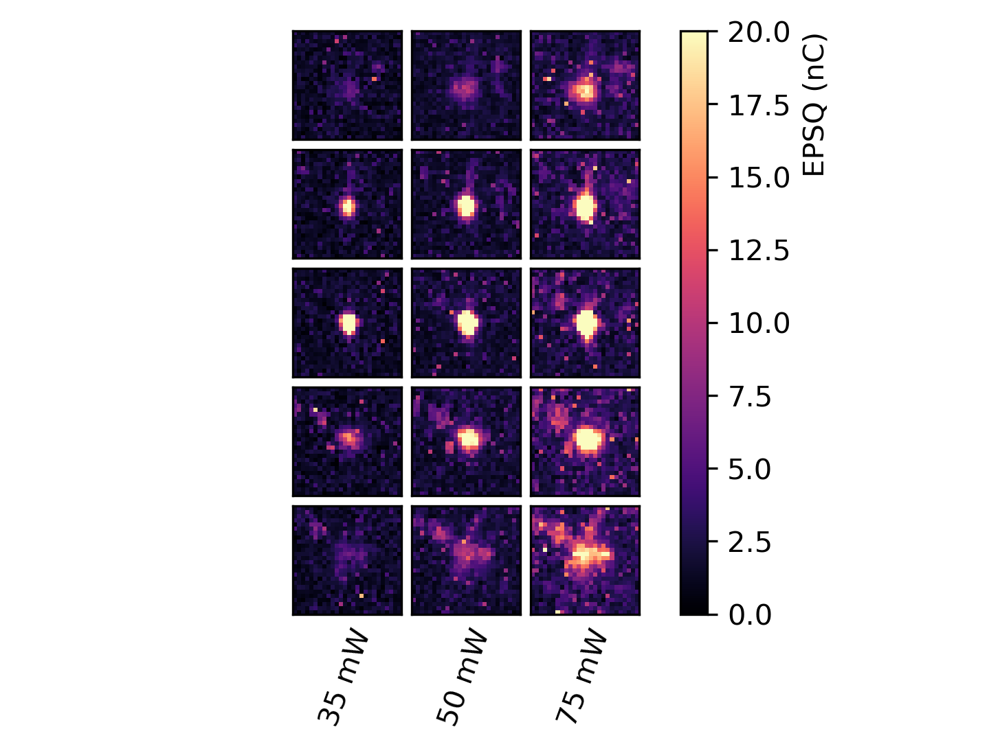

In [7]:
data_path = '../data/masato/B6WT_AAV_hsyn_chrome2f_gcamp8/preprocessed/220308_B6_Chrome2fGC8_030822_Cell2_opsPositive_A_planes.npz'
dat = np.load(data_path, allow_pickle='True')

pscs, I, L = dat['psc'], dat['I'], dat['L']
y = pscs.sum(1)
grid_mean, _, num_stims = util.make_suff_stats(y, I, L)


fig = plt.figure(figsize=(6, 0.75 * 5), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(5),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

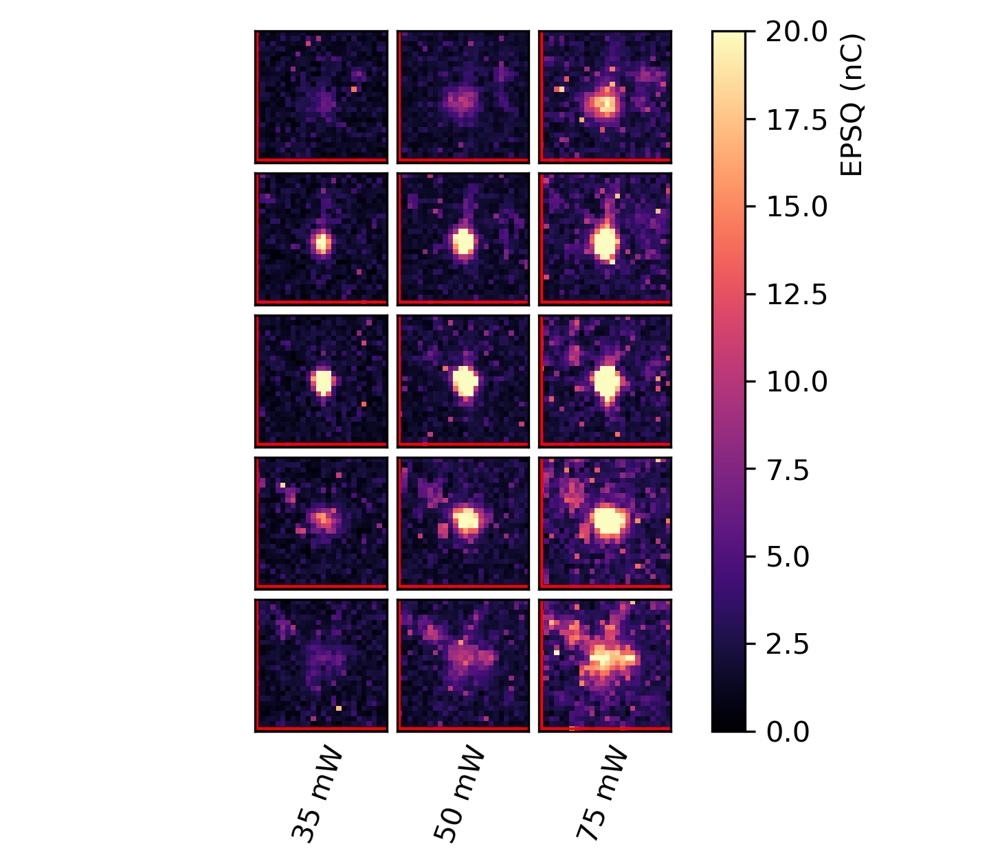

In [8]:
num_planes = len(np.unique(L[:,-1]))
psc_tensor = util.make_psc_tensor(pscs, I, L)
ps = np.arange(3)
xs = np.arange(0,26)
ys = np.arange(0,26)
zs = np.arange(num_planes)
t_max = 900

P, X, Y, Z = np.meshgrid(ps, xs, ys, zs, indexing='ij')
roi_tensor = psc_tensor[P,X,Y,Z,:,0:t_max]


# plot map then add ROI
fig = plt.figure(figsize=(6, 0.75 * 6), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(5),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

num_planes = psc_tensor.shape[3]
axs = fig.axes
from matplotlib.patches import Rectangle
rects = [Rectangle((ys[0],xs[0]), len(ys), len(xs), edgecolor='r', facecolor='None') for _ in range(3 * num_planes)]

for (ax, rect) in zip(axs[1:1 + (3 * num_planes)], rects):
    ax.add_patch(rect)



In [9]:
psc_tensor.shape

(3, 26, 26, 5, 4, 900)

## Visualize ROI

We expand the ROI to explicitly include a connected cell. Double check here that the ROI is where we want. 

Text(0, 0.5, 'current (nA)')

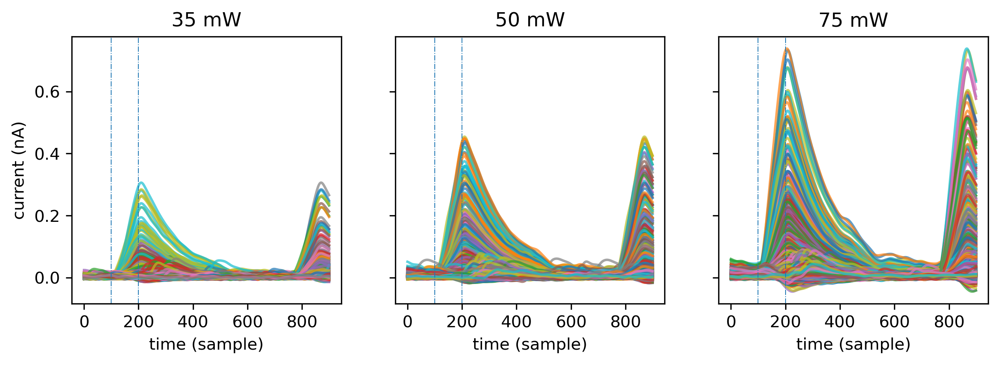

In [10]:
# import seaborn as sns

powers = np.unique(I)
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,3), sharey=True, dpi=300, sharex=True)
for i in range(3):
        axs[i].plot(roi_tensor[i,...].reshape(-1,t_max).T, alpha=0.7,)
        axs[i].axvline(x=100, linestyle='-.', linewidth=0.5)
        axs[i].axvline(x=200, linestyle='-.', linewidth=0.5)
        
        axs[i].set_title('%d mW' % powers[i])
        axs[i].set_xlabel('time (sample)')
axs[0].set_ylabel('current (nA)')

## Scalar QPs

When fitting the rank-1 model, we run into a scalar QP of the form:

$\min_{\alpha} \| x - \alpha u\|_2^2 \quad \text{s.t} \quad \alpha \geq 0, \alpha u \leq x$

In [65]:
def _scalar_underapprox(x, u):
    alpha_hat = jnp.linalg.norm(x) / jnp.linalg.norm(u)
    
    max_violation_idx = jnp.argmax(alpha_hat * u)
    val = jnp.all(alpha_hat * u <= x)
    return  val * alpha_hat + (1 - val) * (x[max_violation_idx] / u[max_violation_idx])

scalar_underapprox = jax.jit(vmap(_scalar_underapprox, in_axes=(1,None)))

        

In [60]:
V_qp = scalar_underapprox(np.random.rand(10,100), np.random.rand(10)[:,None])
V_qp = V_qp[None,:]
V_qp.shape

(1, 100, 1)

In [66]:
def _svd_estimate(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    U, S, VT = np.linalg.svd(unfolded)
    est =  (U[:, :rank] * S[:rank]) @ VT[:rank,:]
    return est.reshape(dims)
    
from jaxopt import OSQP, BoxOSQP,CvxpyQP
import jax
from jax import vmap
import jax

@jax.jit
def solve_r_subproblem_nonneg(G, R, Q):
    qp = OSQP(tol=1e-4)
    def run_qp_solver(obj_matrix, obj_vector, ineq_matrix, ineq_vector):

        # Warm start using the current value of R for the primal variable,
        # and the value of dual_r for the dual variable
        sol = qp.run(init_params=None, # no equality dual vars
                      params_obj=(obj_matrix, obj_vector),
                      params_eq=None,
                      params_ineq=(ineq_matrix, ineq_vector)).params
        return sol.primal, sol.dual_ineq
    N, T = G.shape
    
    ineq_matrix = jnp.concatenate((Q.T, -Q.T), axis=0)
    ineq_vector = jnp.concatenate((G, jnp.zeros((N, T))), axis=1)
    r_primal, r_dual = vmap(
        run_qp_solver,
        in_axes=(None, 0, None, 0))(Q @ Q.T, -G @ Q.T, ineq_matrix, ineq_vector)
    return r_primal, r_dual

def _nmu_estimate_stepwise(tensor, rank=1, stim_start=100, stim_end=200):
    dims = tensor.shape
    ntimesteps = dims[-1]
    X_full = tensor.reshape(-1, ntimesteps)
    X_stim = X_full[:, stim_start:stim_end]


    factors  = nmu.recursive_nmu(np.maximum(X_stim, 0), r=rank)
    U_stim = np.concatenate([factor[0] for factor in factors], axis=-1)
    V_stim = np.concatenate([factor[1] for factor in factors], axis=-1)

    if rank == 1:
        V_qp = scalar_underapprox(X_full, np.squeeze(U_stim))
        V_qp = V_qp[None,:] # turn into row vector
    else:
        V_qp = solve_r_subproblem_nonneg(X_full.T, V_stim.T, U_stim.T)[0].T

    est = U_stim @ V_qp
    return est.reshape(dims)


def _nmu_estimate(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    factors  = nmu.recursive_nmu(np.maximum(unfolded, 0), r=rank)
    est = np.zeros_like(unfolded)
    for (u, v) in factors:
        est += np.outer(u, v)
    return est.reshape(dims)
    

def _parafac_estimate(tensor, rank=1):
    nx, ny, ntrials_curr, ntimesteps = tensor.shape
    reshaped = tensor.reshape(-1, ntrials_curr, ntimesteps)
    cptensor = parafac(np.maximum(reshaped, 0),
                               rank=rank,)

    return tl.cp_to_tensor(cptensor).reshape(nx, ny, ntrials_curr, ntimesteps)

def estimate_photocurrents_all_planes(roi_tensor, rank=1, stepwise=False):
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape


    subtracted = np.copy(roi_tensor)
    full_est = np.copy(roi_tensor)
    

    for power_idx in range(npowers):

        # extract current tensor we're working with. Different powers
        # can have different numbers of trials, which are marked by np.nan
        try:
            ntrials_curr = np.where(np.isnan(roi_tensor[power_idx, 0, 0, 0, :, 0]))[0][0]
        except IndexError:
            ntrials_curr = ntrials

        # This forms an index to extract a particular (power, trials, plane) combination
        _slice = np.s_[power_idx, :, :, :, 0:ntrials_curr, :] 
        tensor_curr = roi_tensor[_slice]

        # Call one of our implemented methods on the data tensor
        if stepwise:
            est = _nmu_estimate_stepwise(tensor_curr, rank=rank)
        else:
            est = _nmu_estimate(tensor_curr, rank=rank)

        subtracted[_slice] = roi_tensor[_slice] - est
        full_est[_slice] = est


    return full_est, subtracted

def estimate_photocurrents(roi_tensor, separate_by_powers=True, rank=1, l2_reg=0.0, method='nmu'):

    _algs = dict(
        nmu=_nmu_estimate,
        parafac=_parafac_estimate,
        svd=_svd_estimate
    )
    if method not in _algs:
        raise ValueError('method must be one of %s' % [x for x in _algs.keys()])

    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape


    subtracted = np.copy(roi_tensor)
    full_est = np.copy(roi_tensor)
    
    for z_idx in range(nz):

        for power_idx in range(npowers):

            # extract current tensor we're working with. Different powers
            # can have different numbers of trials, which are marked by np.nan
            try:
                ntrials_curr = np.where(np.isnan(roi_tensor[power_idx, 0, 0, 0, :, 0]))[0][0]
            except IndexError:
                ntrials_curr = ntrials

            # This forms an index to extract a particular (power, trials, plane) combination
            _slice = np.s_[power_idx, :, :, z_idx, 0:ntrials_curr, :] 
            tensor_curr = roi_tensor[_slice]

            # Call one of our implemented methods on the data tensor
            est = _algs[method](tensor_curr, rank=rank)

            subtracted[_slice] = roi_tensor[_slice] - est
            full_est[_slice] = est


    return full_est, subtracted

def traces_tensor_to_map(tensor):
    return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)

def plot_subtraction(roi_tensor, est, subtracted_roi_tensor,
        order=None, num_plots=30, power_idx=-1, ylim=None):
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    roi_traces, est_traces, subtracted_traces = [x[-1,...].reshape(-1, ntrials, ntimesteps)
        for x in [roi_tensor, est, subtracted_roi_tensor]]

    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    fig, axs = plt.subplots(nrows=num_plots, ncols=3, figsize=(10,num_plots*1.5), sharey=True, dpi=300, sharex=True)

    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)
        axs[i, 1].plot(est_traces[idx].T)
        axs[i, 2].plot(subtracted_traces[idx].T)

        if ylim is not None:
            for j in range(3):
                axs[i,j].set_ylim(*ylim)



def plot_subtraction_comparison(roi_tensor, ests, subtracted_roi_tensors, demixed_roi_tensors,
        colors=['red', 'blue'], order=None,
        num_plots=30, power_idx=-1, z_idx=None,
        ylims=None, override_sharey=False):

    # see if we should restrict plot to only one plane
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    if z_idx is None:
        z_idx = np.arange(nz)

    sharey=True
    if ylims is not None:
        sharey=False

    if override_sharey is not None:
        sharey=override_sharey


    fig, axs = plt.subplots(nrows=num_plots, ncols=4, figsize=(10,num_plots*1.5),
        sharey=sharey, dpi=300, sharex=True, facecolor='white')
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape

    # get order from raw traces
    roi_traces = roi_tensor[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    # plot raw traces outside of the loop over subtraction methods
    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)

    # title each column
    titles = ['raw', 'est', 'subtracted', 'demixed']
    for j in range(4):
        axs[0,j].set_title(titles[j])

    # iterate over maps corresponding to different subtraction methods, plot each
    # in a different color
    for (est, subtracted_roi_tensor, demixed_tensor, color) in zip(
        ests, subtracted_roi_tensors, demixed_roi_tensors, colors):

        

        est_traces, subtracted_traces, demixed_traces = [x[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
            for x in [est, subtracted_roi_tensor, demixed_tensor]]
        
        
        for i in range(num_plots):
            idx = order[i]
            axs[i, 1].plot(est_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 2].plot(subtracted_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 3].plot(demixed_traces[idx].T, color=color, linewidth=0.5)

            if ylims is not None:
                for j in range(4):
                    axs[i,j].set_ylim(*ylims[j])

            for j in range(4):
                axs[i,j].axvline(x=100)
                axs[i,j].axvline(x=200)

    return fig, axs

        
def demix_roi_traces(roi_tensor, demixer_checkpoint):
    # load demixer
    demixer = NeuralDemixer(path=demixer_checkpoint)
    dims = roi_tensor.shape
    ntimesteps = dims[-1]
    raw_traces = roi_tensor.reshape(-1, ntimesteps)
    demixed_traces = util.denoise_pscs_in_batches(raw_traces, demixer)
    return demixed_traces.reshape(dims)





In [67]:
est_nmu, subtracted_nmu = estimate_photocurrents_all_planes(roi_tensor, rank=1, stepwise=True)

In [68]:
demixer_checkpoint = "/Users/Bantin/Documents/Columbia/Projects/2p-opto/circuit_mapping/demixers/nwd_ee_ChroME1.ckpt"
subtracted_demixed_nmu = demix_roi_traces(subtracted_nmu, demixer_checkpoint)


/Users/bantin/Documents/Columbia/Projects/2p-opto/circuit_mapping/circuitmap/neural_waveform_demixing.py:45: RuntimeWarning: invalid value encountered in true_divide
  torch.Tensor((traces/tmax).copy()[:, None, :]).to(device=self.device)


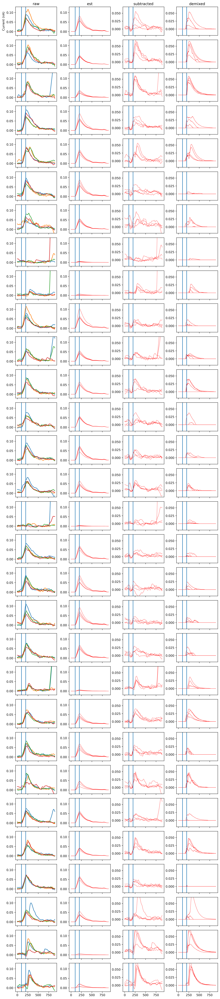

In [69]:

fig, axs = plot_subtraction_comparison(roi_tensor, [est_nmu, ], [subtracted_nmu, ],
    [subtracted_demixed_nmu, ],
    ylims=[(-0.02, 0.13,), (-0.02, 0.13), (-0.02, 0.07), (-0.02, 0.07)],
    z_idx=-1,
    # override_sharey=False)
)
axs[0,0].set_ylabel('Current (nA)')

plt.tight_layout()

**Plot demixed + subtracted maps**

Hard to tell if the demixed residual shapes are reasonable. Maybe map across powers will be informative?

In [48]:


psc_tensor_subtracted = psc_tensor.copy()
psc_tensor_subtracted[P,X,Y,Z,:,0:t_max] = subtracted_nmu
mean_map_subtracted = traces_tensor_to_map(psc_tensor_subtracted)

psc_tensor_demixed = demix_roi_traces(psc_tensor_subtracted, demixer_checkpoint)
mean_map_demixed = traces_tensor_to_map(psc_tensor_demixed)


/var/folders/67/j86q1s2s1_dg5m568j2k9d040000gn/T/ipykernel_25300/861419949.py:144: RuntimeWarning: Mean of empty slice
  return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)


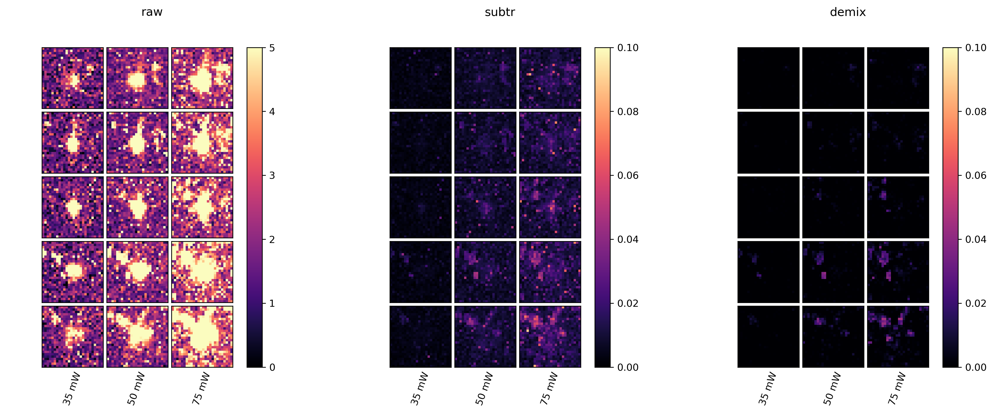

In [49]:

fig = plt.figure(figsize=(18, 6), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean, mean_map_subtracted, mean_map_demixed], np.arange(num_planes),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma', 'magma'],
    # cbar_labels=['EPSQ (nC)'],
    # zlabels=['subtr', 'demix'],
    map_names=['raw', 'subtr', 'demix'],
    vranges=[(0,5), (0,0.1), (0,0.1)],
    powers=np.unique(I))

## Plot traces to check whether map is reasonable

This time we'll reuse the plot_subtraction_comparison function but hand-specify the order to look at the largest subtracted_traces first. We'll also look at the bottom plane since there seems to be more connectivity there.

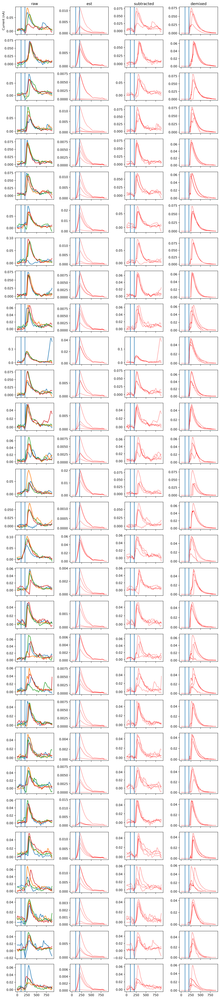

In [50]:
power_idx = -1
z_idx = -1

ntrials, ntimesteps = roi_tensor.shape[-2:]
demixed_traces = subtracted_demixed_nmu[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
mean_map_raw = traces_tensor_to_map(demixed_traces)
order = np.argsort(mean_map_raw)[::-1]

fig, axs = plot_subtraction_comparison(roi_tensor, [est_nmu, ], [subtracted_nmu, ],
    [subtracted_demixed_nmu, ],
    # ylims=[(-0.00, 0.09,), (-0.00, 0.09), (-0.02, 0.05), (-0.02, 0.05)],
    z_idx=z_idx, power_idx=power_idx, order=order,
    override_sharey=False)
axs[0,0].set_ylabel('Current (nA)')

plt.tight_layout()